## Исследование мест общественного питания в г. Москве

**Цель анализа:** Анализ рынка общественного питания в г. Москва

<a name='Описание-проекта'>**Описание проекта** <br> </a>
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены. <br><br>
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Данные для анализа предоставлены в файле "moscow_places.csv".

<a name='Описание-данных'>**Описание данных** <br> </a>
В файле "moscow_places.csv" содержатся данные с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

    name — название заведения;
    address — адрес заведения;
    category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
    hours — информация о днях и часах работы;
    lat — широта географической точки, в которой находится заведение;
    lng — долгота географической точки, в которой находится заведение;
    rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
    price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        «Средний счёт: 1000–1500 ₽»;
        «Цена чашки капучино: 130–220 ₽»;
        «Цена бокала пива: 400–600 ₽».
        и так далее;

    middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

    middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

    chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        0 — заведение не является сетевым
        1 — заведение является сетевым

    district — административный район, в котором находится заведение, например Центральный административный округ;
    seats — количество посадочных мест.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from folium import Marker, Map, Choropleth #Библиотека для карт
import seaborn as sns
import plotly.express as px
import json # Для работы с файлами json
from folium.plugins import MarkerCluster 

### Откроем файлы с данными и выведем общую информацию

In [2]:
# Открываем необходимые файлы
try:
    data = pd.read_csv('local.csv')
except:
    data = pd.read_csv(
         r'https://code.s3.yandex.net/***.csv')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Представлены данные о 8406 точках питания. Тип столбцов и наименование соответствует данным. Пропуски встречаются в 'дополнительных' столбцах (изучим их на этапе [предобработки](#Предобработка-данных))

### Предобработка данных

#### Изменение типа данных

In [5]:
# Изменим тип данных столбца 'chain' в bool
data['chain'] = data['chain'].astype('bool')

Изменим значение типа данных в столбце 'seats' на 'Int64' [после обработке](#замена_seats_Int64)

#### Обработка пропусков

Пропуски встречаются в столбцах:
* hours - заменим на н.д. (нет данных)
* price - заменим на н.д. (нет данных)
* avg_bill - заменим на н.д. (нет данных)
* middle_avg_bill - заменим на среднее значение из avg_bill (по правилам из [описания данных](#Описание-данных)) или оставим None (чтобы не менять тип данных в столбце)
* middle_coffee_cup - заменим на среднее значение из avg_bill (по правилам из [описания данных](#Описание-данных)) или оставим None
* seats - оставим None 

In [6]:
# Проверяем есть ли случае где надо указать middle_avg_bill
data[data.middle_avg_bill.isna() & data.avg_bill.str.startswith(
                            'Средний счёт', na=False)]['name'].count()

0

In [7]:
# Проверяем есть ли случае где надо указать middle_coffee_cup
data[data.middle_coffee_cup.isna() & data.avg_bill.str.contains(
            'капучино', case=False, na=False, regex=False)]['name'].count()

0

Таких случаев нет. Заменяем все пропуски на 'н.д.'

In [8]:
# Заменяем все пропуски в столбцах по списку на 'н.д.'
no_data_list = ['hours', 'price', 'avg_bill']

data[no_data_list] = data[no_data_list].fillna('н.д.')

#### Обработка дубликатов

In [9]:
# Проверяем есть ли дубликаты по названию заведения и адресу
# предварительно переведем все символы в нижний регистр
data[['name','address']].transform(lambda x: x.str.lower()) \
                            .duplicated(['name','address']).sum()

4

In [10]:
# Нашлось 4 объекта-дубликата
# выведем их 
data[data[['name','address']].transform(lambda x: x.str.lower()) \
                     .duplicated(['name','address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,Кафе,кафе,"Москва, парк Ангарские Пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,н.д.,н.д.,NaN,NaN,False,NaN
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,н.д.,н.д.,NaN,NaN,False,NaN
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,н.д.,н.д.,NaN,NaN,False,188.0
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,н.д.,н.д.,NaN,NaN,True,188.0
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,н.д.,н.д.,NaN,NaN,False,150.0
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,н.д.,н.д.,NaN,NaN,True,150.0
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,н.д.,н.д.,NaN,NaN,True,276.0
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,н.д.,55.738449,37.410937,4.1,н.д.,н.д.,NaN,NaN,False,276.0


Кроме названия и адреса, еще у всех дублей одинаковый рейтинг. <br>
Так как дубликатов немного, проведем обработку вручную для ускорения процесса. <br>
Для 'Кафе' (189, 215) ключевые изменениия в графике работы. Будем считать что вторая строка (215) позже написана (+корректный регистр адреса). Удалим строку с индексом 189. <br>
Для остальных дубликатов, помимо графика работы, также различаются значения в поле 'chain'. Проверим, есть ли еще такие названия, и если значение 'не сетевое' указано только в одном случае, удалим дубликат с этим значением.

In [11]:
# Удаляем 189
data = data.drop(189)

In [12]:
# создадим Series с названием дубликатов
names_dupl = data[data[['name','address']].transform(lambda x: x.str.lower()) \
                     .duplicated(['name','address'])]['name']

# count - общее кол-во строк
# sum - кол-во 'сетевых' строк 
for name_dupl in names_dupl:
    count_dupl, sum_dupl = data[data.name.str.lower() == name_dupl.lower()].chain.agg(['count', 'sum'])
    display(f'{name_dupl}: всего строк: {count_dupl}, "сетевых": {sum_dupl}')

'More Poke: всего строк: 3, "сетевых": 2'

'Раковарня Клешни и хвосты: всего строк: 3, "сетевых": 2'

'Хлеб да выпечка: всего строк: 3, "сетевых": 2'

In [13]:
# Оставляем только с указанием того, что заведение сетевое
# удаляем с указанием 'не сетевое'

# Список всех дубликатов
dupl_delete = data[data[['name','address']].transform(lambda x: x.str.lower()) \
                     .duplicated(['name','address'], keep=False)]

data = data.drop(dupl_delete[~dupl_delete.chain].index) # Удаляем по индексам дубликаты где chain==False

In [14]:
# Еще раз проверим что дубликатов с разным регистром не осталось
data[data[['name','address']].transform(lambda x: x.str.lower()) \
                     .duplicated(['name','address'], keep=False)].shape[0]

0

**Было удалено 4 дубликата**

In [15]:
# Проверим наличие повторяющихся уникальных названий среди несетевых заведений
data[data.chain==False].name.value_counts()[lambda x: x!=1] #лямбда функция исключает из выборки значение 1

name
Кафе                 188
Шаурма                43
Ресторан              34
Столовая              28
Кофейня               12
Бистро                12
Кафе-столовая          9
Буфет                  8
Трапезная              7
Шашлычная              6
Поминальные обеды      5
Блины                  3
Пиццерия               3
Кафе-кулинария         2
Чебуречная             2
Кафе для поминок       2
Name: count, dtype: int64

Уникальных названий среди не сетевых заведений не обнаружено. <br>
Проверить корректность заполнения сетевого заведение дальше не предоставляется возможным т.к. в нашем распоряжение только данные по Москве, а другие точки сети могут быть открыты в других городах.

В ходе анализа были обнаруженны ошибки в наименовании сетевых заведений. Такие ошибки очень сложно найти, но которые получилось обнаружить - исправим.

In [16]:
# Проверяем кол-во заведений название которых начинается на 'Яндекс'
data[data.name.str.startswith('Яндекс')]['name'].value_counts()

name
Яндекс Лавка    69
Яндекс.Лавка     3
Яндекс Еда       1
Name: count, dtype: int64

In [17]:
# Меняем названия 'Яндекс.Лавка' на 'Яндекс Лавка' (чаще встречается)
data.loc[data.name=='Яндекс.Лавка', 'name'] = 'Яндекс Лавка'

Попробуем найти дублрующие название заведения с разным написанием названий

In [18]:
# Создаем df с уникальными названиями
df_uniq = data.groupby('name', as_index=False).count()
df_uniq['name'] = df_uniq['name'].str.lower() #переводим названия в нижний регистр

# Создаем df с удаленными из названия символами и пробелами
df_uniq_dupl = df_uniq['name'].str.replace(r'[.,!?;:\'(){}[\]<>/@#$%^&*+=~`\\\s]', '', regex=True)

# Получаем кол-во дубликатов в названии среди 'уникальных'
df_uniq_dupl[df_uniq_dupl.duplicated()].count() 

136

Найдено 136 таких дубликатов

In [19]:
# Чтобы не загружать основной df ненужной информацией создадим его копию
df_copy = data.copy()

# Создадим столбец с названиями без спец символов и пробелов
df_copy['spec_name'] = df_copy['name'].str.lower() \
        .str.replace(r'[.,!?;:\'(){}[\]<>/@#$%^&*+=~`\\\s]', '', \
                     regex=True)

# Добавляем столбец с булевым значеним 'дубликат' по спец имени
df_copy['dupl_spec'] = df_copy.duplicated('spec_name', keep=False)

# Добавляем столбец с булевым значеним 'дубликат' по изначальному имени
df_copy['dupl_name'] = df_copy.duplicated('name', keep=False)

# Удалим все не дублирующие названия (исключаем уникальные имена)
df_copy = df_copy.drop(df_copy[(~df_copy.dupl_spec) & (~df_copy.dupl_name)].index)

'''
На данном этапе у нас есть df с дублями по спец именам
если dupl_name=False - то считается что название уникально (хотя без спец символов это не так)
т.к. названия изначально не уникальны, то нам нет смысла гнаться за "корректным" названием 
и можно оставить любое

Выбираем df уникальных имен по 1 шт (примем за "корректное" название)
Далее находим с таким же спец названием и присваиваем всем им
название из первого (новым столбцом)
'''

# df с уникальными названиями(принимаем за 'корректные') и
# спец названием (используем отрицание т.к. duplicated возращает True на повторы)
df_first_name = df_copy[~df_copy.duplicated('spec_name')][['name', 'spec_name']]

# Объеденим два df по столбцу spec_name и сохранением исходных индексов
# Получим новый столбец с указанием 'корректного' названия заведения
# и сохранением исходных индексов
df_copy = df_copy.reset_index().merge(df_first_name[['name', 'spec_name']], 
                                      how='left', on='spec_name', 
                                      suffixes=('','_new')).set_index('index')

# Получаем Series с исходным индексом и 'корректным' названием
correct_names = df_copy['name_new']

# Изменяем названия в исходном датафрейме по индексу
data.loc[correct_names.index, 'name'] = correct_names

In [20]:
# Еще раз проверим дубликаты
data[data[['name','address']].transform(lambda x: x.str.lower()) \
                     .duplicated(['name','address'], keep=False)].shape[0]

4

In [21]:
# Выведем дубликаты (4 строки) 
data[data[['name','address']].transform(lambda x: x.str.lower()) \
                     .duplicated(['name','address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
599,В парке вкуснее,кафе,"Москва, Северный административный округ, район...",Северный административный округ,"ежедневно, 10:00–21:00",55.854571,37.487254,2.2,н.д.,н.д.,NaN,NaN,False,NaN
600,В парке вкуснее,кофейня,"Москва, Северный административный округ, район...",Северный административный округ,"ежедневно, 10:00–21:00",55.851985,37.478492,2.2,н.д.,н.д.,NaN,NaN,True,NaN
4613,Cafe 13,кафе,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–19:00,55.762779,37.633079,4.3,н.д.,н.д.,NaN,NaN,False,200.0
4780,Cafe 13,ресторан,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–18:00,55.762748,37.633176,4.3,н.д.,н.д.,NaN,NaN,False,200.0


In [22]:
# Повторяем деяствия по удалению дибликатов
# создадим Series с названием дубликатов
names_dupl = data[data[['name','address']].transform(lambda x: x.str.lower()) \
                     .duplicated(['name','address'])]['name']

# count - общее кол-во строк
# sum - кол-во 'сетевых' строк 
for name_dupl in names_dupl:
    count_dupl, sum_dupl = data[data.name.str.lower() == name_dupl.lower()].chain.agg(['count', 'sum'])
    display(f'{name_dupl}: всего строк: {count_dupl}, "сетевых": {sum_dupl}')

'В парке вкуснее: всего строк: 5, "сетевых": 4'

'Cafe 13: всего строк: 2, "сетевых": 0'

Удалим сетевое заведение, где указано "не сетевое" (строка 599) <br>
Удалим 'первое' заведение с другим графиком работы и категорией (строка 4613)

In [23]:
# Удаляем 599 и 4613
data = data.drop([599, 4613])

In [24]:
# Еще раз проверим дубликаты
data[data[['name','address']].transform(lambda x: x.str.lower()) \
                     .duplicated(['name','address'], keep=False)].shape[0]

0

**Было удаленно еще 2 строки-дубликата**

#### Проверка категориальных значений


In [25]:
data['category'].value_counts()

category
кафе               2374
ресторан           2041
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: count, dtype: int64

In [26]:
data['district'].value_counts()

district
Центральный административный округ         2241
Северный административный округ             897
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: count, dtype: int64

In [27]:
data['price'].value_counts()

price
н.д.             5085
средние          2117
выше среднего     564
высокие           478
низкие            156
Name: count, dtype: int64

Дублирующих или странных категорий не обнаружено

#### Проверка количественных значений


In [28]:
quant_list = ['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']

data[quant_list].describe()

,rating,middle_avg_bill,middle_coffee_cup,seats
count,8400.000000,3149.000000,535.000000,4791.000000
mean,4.230250,958.053668,174.721495,108.342308
std,0.469854,1009.732845,88.951103,122.846815
min,1.000000,0.000000,60.000000,0.000000
25%,4.100000,375.000000,124.500000,40.000000
50%,4.300000,750.000000,169.000000,75.000000
75%,4.400000,1250.000000,225.000000,140.000000
max,5.000000,35000.000000,1568.000000,1288.000000


In [29]:
# выведем разбивку по ср. чеку
data['middle_avg_bill'].value_counts(bins=5, sort=False)

(-35.001, 7000.0]     3145
(7000.0, 14000.0]        3
(14000.0, 21000.0]       0
(21000.0, 28000.0]       0
(28000.0, 35000.0]       1
Name: count, dtype: int64

In [30]:
# выделяются значения свыше 7 т.руб
data[data['middle_avg_bill']>=7000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,False,49.0
3396,Марио,ресторан,"Москва, улица Климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,NaN,False,100.0
3487,800°с Contemporary Steak,ресторан,"Москва, Большой Патриарший переулок, 6, стр. 1",Центральный административный округ,"ежедневно, 09:00–23:30",55.762708,37.592138,4.7,высокие,Средний счёт:6000–8000 ₽,7000.0,NaN,False,75.0
3882,White Rabbit,ресторан,"Москва, Смоленская площадь, 3",Центральный административный округ,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7250.0,NaN,False,150.0
5481,Гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,False,NaN
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,False,100.0


Три заведения с огромным средним чеком находятся не в центре, при этом еще и являются максимальными по ср. чеку. Одно заведение является баром. <br>
На всякий случай проверим их по карте.

In [31]:
# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['address']}"
    ).add_to(m)

# применяем функцию для создания маркера где ср. стоимость >=10 т.руб
data[data['middle_avg_bill']>=10000].apply(create_marker, axis=1)
    
# выводим карту
m

Все три заведения выглядят нереалистично. Возможно это место регистрации юр. лица, а не само заведение. Удалим их.

In [32]:
# Удаляем заведения со средним чеком выше 10 т.руб
data = data.drop(data[data['middle_avg_bill']>=10000].index)

In [33]:
# выведем разбивку по ср. чеку чашки капучино
data['middle_coffee_cup'].value_counts(bins=5, sort=False)

(58.491, 361.6]     533
(361.6, 663.2]        1
(663.2, 964.8]        0
(964.8, 1266.4]       0
(1266.4, 1568.0]      1
Name: count, dtype: int64

In [34]:
# выделяются значения свыше 350 руб
data[data['middle_coffee_cup']>=350]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,True,48.0
5503,Coffee FM,кофейня,"Москва, Авиамоторная улица, 10, корп. 1",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–19:00",55.754233,37.715491,4.3,н.д.,Цена чашки капучино:250–500 ₽,NaN,375.0,False,190.0


Чашка капучино в сетевом заведении стоит нереалистично дорого. Скорей всего имеет место опечатка. <br> Заменим значения на медианное по сети. А значение avg_bill на самое часто значение по сети.

In [35]:
# Заменим значения middle_coffee_cup на медианное по сети

# Запишим индекс строки для замены
rep_index = data[(data['name']=='Шоколадница') & (data['middle_coffee_cup']>=350)].index

# Произведем замену
data.loc[rep_index, 'middle_coffee_cup'] = data[(data['name']=='Шоколадница') 
                                    & data['chain']]['middle_coffee_cup'].median()

In [36]:
# Заменим значения avg_bill на самое частое по сети (исключая н.д.)
data.loc[rep_index, 'avg_bill'] = data[(data['name']=='Шоколадница') 
                            & (data['chain']) & (data.avg_bill!='н.д.')]['avg_bill'].mode().array

In [37]:
# выведем разбивку по ср. чеку чашки капучино
data['seats'].value_counts(bins=5, sort=False)

(-1.289, 257.6]     4391
(257.6, 515.2]       342
(515.2, 772.8]        38
(772.8, 1030.4]        2
(1030.4, 1288.0]      16
Name: count, dtype: int64

Количество сидячих мест равное 0 может быть в заведениях, где не предполагается сидячих мест. <br>
Проверяем есть ли рестораны, столовые, кафе без сидячих мест.

In [38]:
# выделяются значения = 0 мест для ресторанов, столовых, кафе
cat_list = ['ресторан', 'кафе', 'столовая']
data[data['seats']==0].query('category in @cat_list')['seats'].count()

69

In [39]:
# Присвоим таким заведением кол-во сид. мест NaN
rep_index = data[data['seats']==0].query('category in @cat_list').index
data.loc[rep_index, 'seats'] = np.nan

In [40]:
# Просмотрим значения которые выпадают из 1.5IQR 
iqr = data['seats'].quantile(0.75) - data['seats'].quantile(0.25)
lower_bound = data['seats'].quantile(0.25) - (1.5 * iqr)
upper_bound = data['seats'].quantile(0.75) + (1.5 * iqr)
lower_bound, upper_bound

(-110.0, 290.0)

290 сидячих мест мало, поэтому не будем брать такую границу. Согласно открытым источникам, заведений, которые имеют более 500 сидячих мест, единицы. Отдельные проблемы вызывают фудкорты различных формаций. Нет регламентированного определения, что является "седячим местом" в точках общественного питания. <br>
Поэтому все что больше 500 сидячих мест заменим на NaN, остальные трогать не будем.

In [41]:
# Все что более 500 сидячих мест - заменяем на NaN
rep_index = data[data['seats']>500].index
data.loc[rep_index, 'seats'] = np.nan

Теперь для всех сетевых заведений, где неизвестно кол-во сидячих мест укажем медианное значение для этой сети.

In [42]:
# Выведем количество записей с сетевыми заведениями и без указания 
# кол-ва сидячих мест
data[data.seats.isna() & data.chain]['name'].count()

1327

In [43]:
# Функция принимает строку и присваивает кол-во 
# сидячих мест медианной по сети с учетом категорий т.к. название не уникально
def median_seats_chain(row):
#    print(row['name']) #row.name - индекс,а не столбец
     data.loc[row.name, 'seats'] = data[(data.name==row['name']) & 
                                             (data.category==row['category'])
                                        & (data['seats'].notna())
                                       & (data.chain)]['seats'].median()

data[data.seats.isna() & data.chain].apply(median_seats_chain, axis=1)

# Выведем сколько осталось таких строк (по всей сети кол-во сидячих мест неопределенно)
data[data.seats.isna() & data.chain]['name'].count()

462

Было не определено 1327 сетевых заведений, стало 467 (по всей сети не определено кол-во сидячих мест). Также стоит учитывать, что наименование и категория заведений не уникально и возможно заведение не относится к этой сети. <a name='замена_seats_Int64'></a>

In [44]:
# Изменим тип данных 'seats' на Int64 отбросив десятичную часть
data['seats'] = data['seats'].round(0).astype('Int64')

In [45]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8397 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8397 non-null   object 
 1   category           8397 non-null   object 
 2   address            8397 non-null   object 
 3   district           8397 non-null   object 
 4   hours              8397 non-null   object 
 5   lat                8397 non-null   float64
 6   lng                8397 non-null   float64
 7   rating             8397 non-null   float64
 8   price              8397 non-null   object 
 9   avg_bill           8397 non-null   object 
 10  middle_avg_bill    3146 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8397 non-null   bool   
 13  seats              5529 non-null   Int64  
dtypes: Int64(1), bool(1), float64(5), object(7)
memory usage: 1.2+ MB


In [46]:
# Выведем кол-во пропусков по столбцам
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
middle_avg_bill      5251
middle_coffee_cup    7862
chain                   0
seats                2868
dtype: int64

#### Добавление необходимых столбцов


Добавим столбец с указанием адреса <br>
Для начала изучим как можно разделить строку с адресом, чтобы выделить улицу <br>
Проверим все ли адреса начинаются с 'Москва', ведь теперь 'Москва' понятие растяжимое. По [анализу округов](#Проверка-категориальных-значений) видим что в датасете данные только по части Москвы внутри МКАДа.

In [47]:
# Проверяем все ли начинаются с 'Москва'
data['address'].str.startswith('Москва').sum()

8397

Все 8403 строки начинаются с 'Москва'. Тогда вторая часть после ',' будет указание улицы

In [48]:
# Выделим часть из названия с указанием 'улицы'

# Создаем список с подстроками для поиска
type_streets = ['улица', 'проспект', 'шоссе', 'переулок',
                'проспект', 'бульвар', 'проезд', 'тупик',
                'МКАД', 'парк', 'площадь', 'квартал',
               'аллея', 'сквер', 'линия', 'поселок',
               'просек', 'ул.', 'Третье транспортное кольцо',
               'набережная', 'пр-т', 'ботанический сад',
               'мост', 'Серебряный бор', 'ландшафтный заказник',
               'тоннель', 'сад Эрмитаж', 'микрорайон', 'музей-заповедник',
                'посёлок', 'Ботанический сад'] 

# Напишим функцию, которая будет возращать 'улицу' из адреса
def search_street(address):
    for part_string in address.split(',')[1:]: # исключаем первую часть 'Москва'
        if any(x in part_string for x in type_streets): #генератор поиска подстроки по списку
            # print('Нашел ', part_string)
            return part_string.strip()
        else:
            # print('Не нашел ', part_string)
            pass #необязательно, но явно
        
# data['street'] = data['address'].transform(search_street)
data.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8235,Лапша. Вок. Димсамы,ресторан,"Москва, проспект Андропова, 1",Южный административный округ,"ежедневно, 10:00–22:00",55.693792,37.676920,3.5,средние,Средний счёт:300–600 ₽,450.0,NaN,False,250
2385,Кофе,кофейня,"Москва, Ярославская улица, 8, корп. 3",Северо-Восточный административный округ,"пн-пт 09:00–19:00; сб,вс 10:00–17:00",55.817469,37.649384,4.7,н.д.,н.д.,NaN,NaN,True,28
3236,Буханка,булочная,"Москва, Хорошёвское шоссе, 25А, корп. 2",Северный административный округ,"ежедневно, 07:00–22:00",55.775342,37.527187,4.4,н.д.,н.д.,NaN,NaN,True,50
1616,Ма Ми,кафе,"Москва, Вятская улица, 27, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.796907,37.581882,4.7,средние,Средний счёт:от 500 ₽,500.0,NaN,False,50
5168,Игристый,"бар,паб","Москва, Пятницкая улица, 82/34с1",Центральный административный округ,"пн-чт 13:00–00:00; пт,сб 13:00–03:00; вс 13:00...",55.730220,37.625421,4.4,выше среднего,Средний счёт:1000–2000 ₽,1500.0,NaN,False,<NA>


In [49]:
%%timeit
data['street'] = data['address'].transform(search_street)

11.8 ms ± 180 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [50]:
# Проверим сколько осталось пустых 'улиц'
data[data.street.isna()].shape[0]

31

Не заполнилась 31 'улица'. В большинстве случаев нет указания на 'улицу', а только район/округ. Оставим такие объекты пустыми.

Добавим столбец с булевым значением с указанием круглосуточных заведений. <br>
Нужно определеится как обозначены заведения которые работают 24/7. <br>

In [51]:
data['hours'].value_counts() # смотрим уникальные значения режимов работы

hours
ежедневно, 10:00–22:00                                                  759
ежедневно, круглосуточно                                                729
н.д.                                                                    535
ежедневно, 11:00–23:00                                                  396
ежедневно, 10:00–23:00                                                  309
                                                                       ... 
пн-пт 17:00–03:00; сб,вс 17:00–05:00                                      1
пн,вт 09:00–21:00; ср-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00      1
пн-пт 12:00–01:00                                                         1
пн-пт 10:30–21:30; сб,вс 10:30–22:30                                      1
пн-сб 10:30–21:30                                                         1
Name: count, Length: 1306, dtype: int64

In [52]:
# сверяем кол-во 'круглосуточно' и 'ежедневно, круглосуточно'
data['hours'].str.contains('круглосуточно').sum()

771

In [53]:
# не везьде где встречается 'круглосуточно', работают 'ежедневно'
# выведем уникальные значения 'круглосуточно', без 'ежедневно'
data[data['hours'].str.contains('круглосуточно') & \
     (~data['hours'].str.contains('ежедневно'))]['hours'].value_counts()

hours
пн-чт 08:00–23:00; пт 08:00–00:00; сб круглосуточно; вс 00:00–23:00                            3
пн-чт 07:30–23:00; пт 07:30–00:00; сб круглосуточно; вс 00:00–23:00                            2
пн-чт 08:00–23:00; пт,сб круглосуточно; вс 08:00–23:00                                         2
пн 08:00–23:00; вт-вс круглосуточно                                                            1
пн-чт 08:00–00:00; пт,сб круглосуточно; вс 08:00–00:00                                         1
пн-чт 08:00–22:00; пт 08:00–00:00; сб круглосуточно; вс 00:00–22:00                            1
пн,вт 10:00–00:00; ср-вс круглосуточно                                                         1
пн 06:00–00:00; вт-вс круглосуточно                                                            1
пн-чт 10:00–00:00; пт-вс круглосуточно                                                         1
пн-чт 07:00–23:00; пт 07:00–00:00; сб круглосуточно; вс 00:00–23:00                            1
пн-чт 10:00–23:00; пт 10

Потвердили, что только заведения с указанием режима работы *'ежедневно, круглосуточно'*, работают по графику 24/7

In [54]:
# Добавим столбец с булевым значением
# с указанием круглосуточных заведений

data.loc[data['hours']=='ежедневно, круглосуточно','is_24_7'] = True
data.loc[data['hours']!='ежедневно, круглосуточно','is_24_7'] = False
data['is_24_7'] = data['is_24_7'].astype('bool') 
data.sample(5) # проверяем на 5 случайных строках

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3278,Cinnabon,кофейня,"Москва, Кутузовский проспект, 57",Западный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.727904,37.475595,4.2,н.д.,Средний счёт:300–500 ₽,400.0,NaN,True,96,Кутузовский проспект,False
1876,Злачное место,"бар,паб","Москва, улица Руставели, 15",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.813632,37.597587,4.3,н.д.,Цена бокала пива:260–380 ₽,NaN,NaN,False,35,улица Руставели,False
2584,Coffeelovers,кофейня,"Москва, Первомайская улица, 42",Восточный административный округ,"ежедневно, 08:00–23:00",55.792765,37.787841,4.6,выше среднего,Средний счёт:700 ₽,700.0,NaN,False,100,Первомайская улица,False
8098,Кухня гастро-паб,"бар,паб","Москва, Новоданиловская набережная, 6, корп. 1",Южный административный округ,пн-пт 08:00–22:00,55.698129,37.625198,4.2,выше среднего,н.д.,NaN,NaN,False,200,Новоданиловская набережная,False
3028,Кафе бар Семави,"бар,паб","Москва, Крылатская улица, 33, корп. 3",Западный административный округ,"ежедневно, 11:00–23:00",55.769722,37.407986,4.6,высокие,н.д.,NaN,NaN,False,184,Крылатская улица,False


In [55]:
# Выводим итоговую информацию о датафрейме
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8397 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8397 non-null   object 
 1   category           8397 non-null   object 
 2   address            8397 non-null   object 
 3   district           8397 non-null   object 
 4   hours              8397 non-null   object 
 5   lat                8397 non-null   float64
 6   lng                8397 non-null   float64
 7   rating             8397 non-null   float64
 8   price              8397 non-null   object 
 9   avg_bill           8397 non-null   object 
 10  middle_avg_bill    3146 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8397 non-null   bool   
 13  seats              5529 non-null   Int64  
 14  street             8366 non-null   object 
 15  is_24_7            8397 non-null   bool   
dtypes: Int64(1), bool(2), float64

**Промежуточный вывод по предобработке данных**: <br>
- Было удалено 3 объекта с огромным средним чеком и подозрительным расположением;
- Изменены типы данных для удобства работы;
- Обработанны пропуски. По итогу пропуски остались в столбцах 'middle_avg_bill', 'middle_coffee_cup' и 'seats'. Пропуски были заполнены значением 'н.д.' (нет данных) где нет возможности подобрать замену. По столбцу 'seats' частично пропуски были заменены медианным значением по сети и категории заведения (только для сетевых заведений);
- Явных дубликатов не обнаружено;
- Замена разных названий сетевых заведений ('Яндекс.Лавка' и 'Яндекс Лавка');
- Добавленые необходимые для анализа столбцы 'street' (с указанием улицы) и 'is_24_7' (с указанием круглосуточных заведений);

### Анализ данных по г. Москве

#### Анализ категорий заведений

Частично анализ был произведен на этапе [проверке категориальных значений](#Проверка-категориальных-значений)

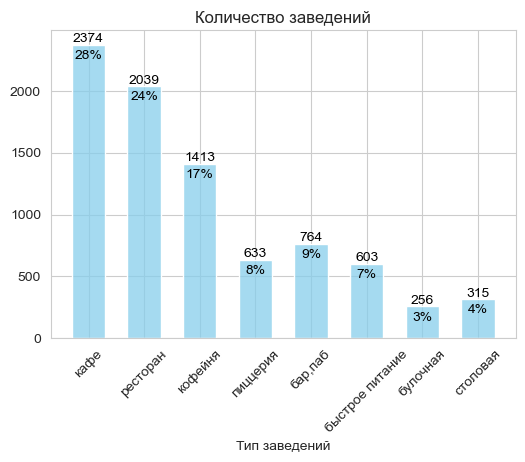

In [56]:
# Выведем гистограмму по категориям заведений
sns.set_style("whitegrid")
fig, ax = plt.subplots()

sns.histplot(data=data, x="category", kde=False, bins=10, 
             color='skyblue', ax=ax, 
             shrink=0.6, #ширина отображения столбца в %
            )

# Настройки графика
ax.set_title("Количество заведений")
ax.set_ylabel("")
ax.set_xlabel("Тип заведений")
fig.set_figheight(4)
fig.set_figwidth(6)

# Поворот подписей оси X для удобства чтения
plt.xticks(rotation=45, fontsize=10)

# Добавление меток (с указанием значений над каждым столбцом и процентом от общего числа)
rows_count = data.shape[0]
for p in ax.patches:
    count_in_cat = int(p.get_height())
    percent = count_in_cat/rows_count*100
    ax.annotate(count_in_cat, (p.get_x() + p.get_width()/2, p.get_height()), 
                ha='center', va='baseline', fontsize=10, color='black', xytext=(0, 2), 
                textcoords='offset points')
    ax.annotate(f'{percent:.0f}%', (p.get_x() + p.get_width()/2, p.get_height()), 
                ha='center', va='baseline', fontsize=10, color='black', xytext=(0, -10), 
                textcoords='offset points')

# Включаем сетку
plt.grid(True)

plt.show()

**Промежуточный вывод по анализу категорий помещений**: <br>
- В г. Москве больше всего кафе (28%), ресторанов (24%) и кофеен (17%). Остальных типов заведений общественного питания заметно меньше.
- Есть сложность в определении одного типа от другого т.к. нет явных признаков разделения. Юридического разделения между многими категориями нет (например между кафе и рестораном).

#### Анализ посадочных мест


Проанализируем кол-во мест по типам заведений

In [57]:
# Создадим смежную таблицу с данными по кол-ву сидячих мест в разрезе типов заведений
category_seat = data.pivot_table(index='category', values='seats', 
                                 aggfunc=['count', 'max', 'sum', 'mean', 'median']
                                ).droplevel(1, axis=1).reset_index()
category_seat

,category,count,max,sum,mean,median
0,"бар,паб",491,480,52956,107.85336,80.0
1,булочная,201,478,15412,76.676617,50.0
2,быстрое питание,399,500,38283,95.947368,65.0
3,кафе,1368,500,124477,90.991959,62.0
4,кофейня,981,500,95056,96.897044,85.0
5,пиццерия,494,455,42135,85.293522,50.0
6,ресторан,1422,500,164280,115.527426,90.0
7,столовая,173,428,16081,92.953757,80.0


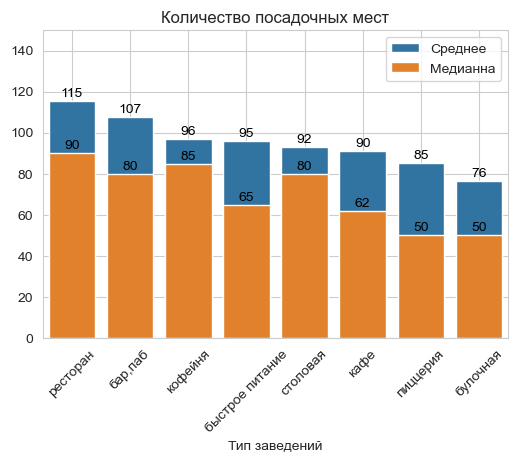

In [58]:
# Выведем распределение сидячих мест по категориям заведений
sns.set_style("whitegrid")
sns.color_palette('pastel')
fig, ax = plt.subplots()

# Сделаем отсортированный список, чтобы применить сортировку в графике
sorted_data = category_seat.sort_values('mean', ascending=False)['category']

# Строим график по средние значения
sns.barplot(data=category_seat, x="category", y="mean",
              ax=ax, label='Среднее', order=sorted_data)

# Строим график по медианным значения
sns.barplot(data=category_seat, x="category", y="median",
              ax=ax, label='Медианна', order=sorted_data)

# Настройки графика
ax.set_title("Количество посадочных мест")
ax.set_ylabel("")
ax.set_xlabel("Тип заведений")
fig.set_figheight(4)
fig.set_figwidth(6)
ax.set_ylim(0,150)

# Поворот подписей оси X для удобства чтения
plt.xticks(rotation=45, fontsize=10)
   
# Добавление меток (с указанием значений над каждым столбцом)
for p in ax.patches:
    count_in_cat = int(p.get_height())
    ax.annotate(count_in_cat, (p.get_x() + p.get_width()/2, p.get_height()), 
                ha='center', va='baseline', fontsize=10, color='black', xytext=(0, 3), 
                textcoords='offset points')

# Включаем сетку
plt.grid(True)
# Располагаем легенду
sns.move_legend(ax, "upper right")

plt.show()

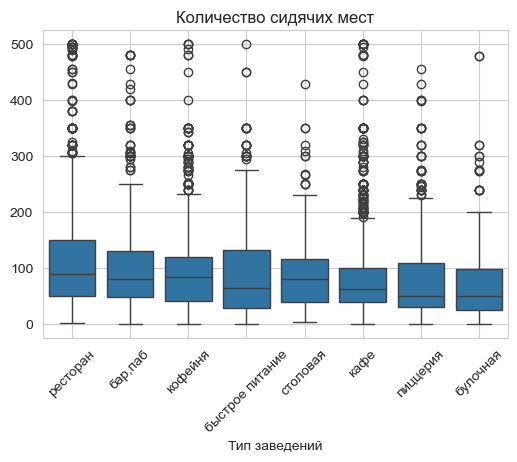

In [59]:
# Построим boxplot чтобы выяснить размах значений по категориям
sns.set_style("whitegrid")
fig, ax = plt.subplots()

# Сделаем отсортированный список, чтобы применить сортировку в графике
sorted_data = category_seat.sort_values('mean', ascending=False)['category']

# Строим boxplot по кол-ву сидячих мест в разрезе категорий
sns.boxplot(data=data, x="category", y="seats",
             order=sorted_data)

# Настройки графика
ax.set_title("Количество сидячих мест")
ax.set_ylabel("")
ax.set_xlabel("Тип заведений")
fig.set_figheight(4)
fig.set_figwidth(6)

# Поворот подписей оси X для удобства чтения
plt.xticks(rotation=45, fontsize=10)

# Включаем сетку
plt.grid(True)

plt.show()

**Промежуточный вывод по анализу посадочных мест**: <br>
- Количество посадочных мест сильно отличается вне зависимости от типа заведения. 
- В среднем больше всего посадочных мест в 'ресторанах' и 'барах/пабах' (контринтуитивно, требуется дополнительный анализ).
- По медианным значениям лидируют 'рестораны' и 'кофейни'.
- Самых большой размах по количеству посадочных мест по категории "быстрое питание" (предположительно связано с фудкортами). Далее чуть уступают, но с большим количеством выбросов 'рестораны'.
- Есть сложность с определением посадочных мест. Например для заведений с фудкортом (общий зал для нескольких заведений)

#### Анализ сетевых заведений

In [60]:
# Выведем соотношение сетевых заведений к несетевым
ratio_ch_notch = data['chain'].sum() / (data['chain'].count() - data['chain'].sum())
# Отношение сетевых ко всем
ratio_ch = data['chain'].sum() / data['chain'].count() 
                                                              
display(f'Отношение сетевых заведений к несетевым составляет: {ratio_ch_notch*100:.0f}%')
display(f'Отношение сетевых заведений ко всем заведениям составляет: {ratio_ch*100:.0f}%')

'Отношение сетевых заведений к несетевым составляет: 62%'

'Отношение сетевых заведений ко всем заведениям составляет: 38%'

In [61]:
# Подсчитываем количество True и False
counts = data['chain'].value_counts()

# Создаем круговую диаграмму
fig = px.pie(values=counts, names=['Несетевые заведения', 'Сетевые заведения'], 
             title='Соотношение сетевых и несетевых заведений',
             color_discrete_sequence=px.colors.qualitative.Pastel1)

fig.update_traces(textposition='inside', textinfo='percent+label+value',
                  textfont_size=12,
                   marker=dict(line=dict(color='#000000', width=1)))

fig.update_layout(width=600, height=500)
fig.show()

In [62]:
# Создадим смежную таблицу с указанием данных по сетевым/несетевым заведениям
# в разрезе категорий
df_catering = data.pivot_table(index='category', values='chain',
                aggfunc=['count','sum']
                ).droplevel(1, axis=1).reset_index().sort_values('count', ascending=False)
# Переименовываем столбцы
df_catering = df_catering.rename(columns={'count':'all_cater', 'sum':'count_chain'}) 
# Создаем столбец с кол-во несетевых заведений по категориям
df_catering['count_not_chain'] = df_catering['all_cater'] - df_catering['count_chain']
df_catering

,category,all_cater,count_chain,count_not_chain
3,кафе,2374,779,1595
6,ресторан,2039,730,1309
4,кофейня,1413,720,693
0,"бар,паб",764,169,595
5,пиццерия,633,330,303
2,быстрое питание,603,232,371
7,столовая,315,88,227
1,булочная,256,157,99


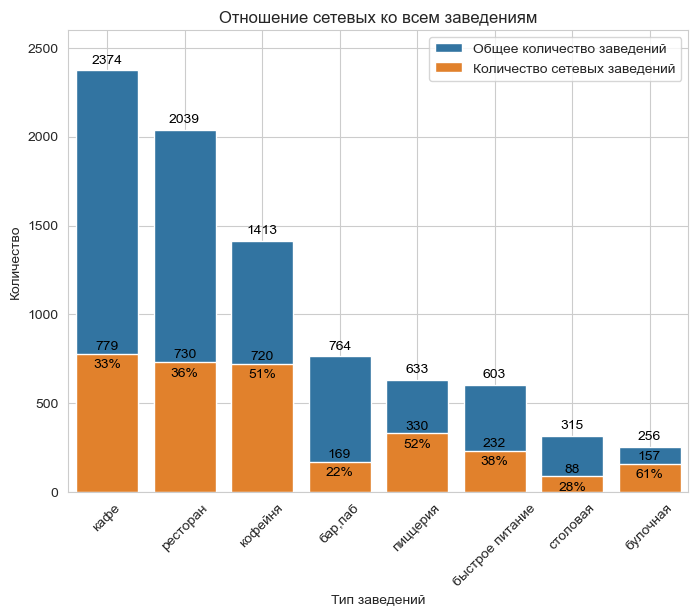

In [63]:
# Выведем отношение сетевых к общим по категориям заведений
sns.set_style("whitegrid")
sns.color_palette('pastel')
fig, ax = plt.subplots()

# Строим график по общиму кол-ву заведений
sns.barplot(data=df_catering, x="category", y='all_cater',
              ax=ax, label='Общее количество заведений')

# Строим график по кол-ву сетевых заведений
sns.barplot(data=df_catering, x="category", y="count_chain",
              ax=ax, label='Количество сетевых заведений')

# Настройки графика
ax.set_title("Отношение сетевых ко всем заведениям")
ax.set_ylabel("Количество")
ax.set_xlabel("Тип заведений")
fig.set_figheight(6)
fig.set_figwidth(8)
ax.set_ylim(0,2600)

# Поворот подписей оси X для удобства чтения
plt.xticks(rotation=45, fontsize=10)
   
# Добавление меток (с указанием значений каждого столбца)
main_count = list() # Создаем список для записи значений 'основного' столбца
for number_bar, bars in enumerate(ax.containers): # Проходимся по столбцам
    i = 0 # Порядковый номер 'основного' столбца на графике
    for p in bars: # Получаем геометрические данные по столбцам
        count_in_cat = int(p.get_height()) # Записываем в переменну количественное значение 
        if number_bar == 0: # Если первый столбец (основной, всего)
                main_count.append(count_in_cat)
                i+=1
                ax.annotate(count_in_cat, (p.get_x() + p.get_width()/2, p.get_height()), 
                            ha='center', va='baseline', fontsize=10, color='black', xytext=(0, 5), 
                            textcoords='offset points')
        else: # Для других 'подстолбцов'
            percent = count_in_cat/main_count[i]*100
            i+=1
            ax.annotate(count_in_cat, (p.get_x() + p.get_width()/2, p.get_height()), 
                        ha='center', va='baseline', fontsize=10, color='black', xytext=(0, 3), 
                        textcoords='offset points')
            ax.annotate(f'{percent:.0f}%', (p.get_x() + p.get_width()/2, p.get_height()), 
                ha='center', va='baseline', fontsize=10, color='black', xytext=(0, -10), 
                textcoords='offset points')   
    
# Включаем сетку
plt.grid(True)
# Располагаем легенду
sns.move_legend(ax, "upper right")

plt.show()

Rectangle(xy=(0, 0), width=0.4, height=779, angle=0)
([0, 1, 2, 3, 4, 5, 6, 7], [Text(0, 0, 'кафе'), Text(1, 0, 'ресторан'), Text(2, 0, 'кофейня'), Text(3, 0, 'пиццерия'), Text(4, 0, 'бар,паб'), Text(5, 0, 'быстрое питание'), Text(6, 0, 'булочная'), Text(7, 0, 'столовая')])
[Text(0, 0, 'кафе'), Text(1, 0, 'ресторан'), Text(2, 0, 'кофейня'), Text(3, 0, 'пиццерия'), Text(4, 0, 'бар,паб'), Text(5, 0, 'быстрое питание'), Text(6, 0, 'булочная'), Text(7, 0, 'столовая')]
Rectangle(xy=(1, 0), width=0.4, height=730, angle=0)
([0, 1, 2, 3, 4, 5, 6, 7], [Text(0, 0, 'кафе'), Text(1, 0, 'ресторан'), Text(2, 0, 'кофейня'), Text(3, 0, 'пиццерия'), Text(4, 0, 'бар,паб'), Text(5, 0, 'быстрое питание'), Text(6, 0, 'булочная'), Text(7, 0, 'столовая')])
[Text(0, 0, 'кафе'), Text(1, 0, 'ресторан'), Text(2, 0, 'кофейня'), Text(3, 0, 'пиццерия'), Text(4, 0, 'бар,паб'), Text(5, 0, 'быстрое питание'), Text(6, 0, 'булочная'), Text(7, 0, 'столовая')]
Rectangle(xy=(2, 0), width=0.4, height=720, angle=0)
([0, 1, 2

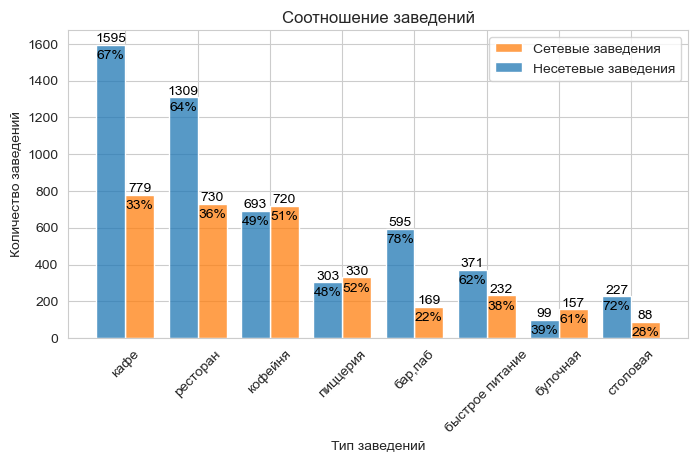

In [64]:
# Выведем гистограмму по категориям заведений
sns.set_style("whitegrid")
fig, ax = plt.subplots()

# Сделаем отсортированный список, чтобы применить сортировку в графике
sorted_data = category_seat.sort_values('mean', ascending=False)['category']

sns.histplot(data=data, x='category', hue='chain', multiple='dodge',
             kde=False, color='skyblue', ax=ax,
             shrink=0.8, #ширина отображения столбца в %
            )

# Настройки графика
ax.set_title("Соотношение заведений")
ax.set_ylabel("Количество заведений")
ax.set_xlabel("Тип заведений")
fig.set_figheight(4)
fig.set_figwidth(8)

# Поворот подписей оси X для удобства чтения
plt.xticks(rotation=45, fontsize=10)

# Добавление меток (с указанием значений над каждым столбцом и процентом)
for p in ax.patches:
    print(p)
    count_in_cat = int(p.get_height()) # значение текущего столбца
    # получаем название текущей категории
    print(plt.xticks())
    print(plt.xticks()[1])
    categ_name = plt.xticks()[1][int((p.get_x()).round(0))].get_text() 
    # получаем общее количество заведений по текущей категории
    categ_all_cater = df_catering[df_catering['category']==categ_name]['all_cater'].iloc[0]
    percent = count_in_cat/categ_all_cater*100 # получаем процентное соотношение
    # Наносим подписи
    ax.annotate(count_in_cat, (p.get_x() + p.get_width()/2, p.get_height()), 
                ha='center', va='baseline', fontsize=10, color='black', xytext=(0, 2), 
                textcoords='offset points')
    ax.annotate(f'{percent:.0f}%', (p.get_x() + p.get_width()/2, p.get_height()), 
                ha='center', va='baseline', fontsize=10, color='black', xytext=(0, -10), 
                textcoords='offset points')

# Переименовываем легенду
plt.legend(labels=['Сетевые заведения','Несетевые заведения'])
# Включаем сетку
plt.grid(True)

plt.show();

In [65]:
df_pop_chain = data[data['chain']].groupby(by=['name', 'category'])['address'] \
    .count().reset_index().sort_values('address', ascending=False).head(15)
df_pop_chain

,name,category,address
1127,Шоколадница,кофейня,119
499,Домино'с Пицца,пиццерия,76
492,Додо Пицца,пиццерия,74
1143,Яндекс Лавка,ресторан,72
205,One Price Coffee,кофейня,71
72,Cofix,кофейня,65
241,Prime,ресторан,49
551,КОФЕПОРТ,кофейня,42
635,Кулинарная лавка братьев Караваевых,кафе,39
966,Теремок,ресторан,36


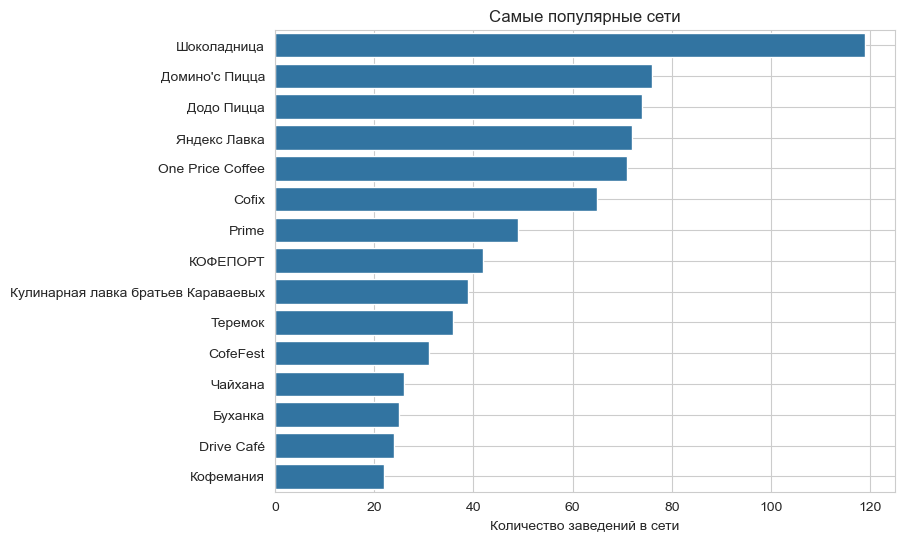

In [66]:
# Выведем отношение сетевых к общим по категориям заведений
sns.set_style("whitegrid")
sns.color_palette('pastel')
fig, ax = plt.subplots()

# Строим график по общиму кол-ву заведений
sns.barplot(data=df_pop_chain, x="address", y='name',
              ax=ax)

# Настройки графика
ax.set_title("Самые популярные сети")
ax.set_ylabel("")
ax.set_xlabel("Количество заведений в сети")
fig.set_figheight(6)
fig.set_figwidth(8)

# Добавление меток (с указанием значений каждого столбца)
for p in bars: # Получаем геометрические данные по столбцам
    count_in_cat = int(p.get_width()) # Записываем в переменну количественное значение 
    ax.annotate(count_in_cat, (p.get_width(), p.get_y() + p.get_height()/1.5), 
                ha='center', va='baseline', fontsize=10, color='black', xytext=(8, 0), 
                textcoords='offset points')
       
# Включаем сетку
plt.grid(True)

plt.show()

In [67]:
# Типы популярнеых сетей
df_pop_chain.pivot_table(index='category', values='address', aggfunc='sum'
                        ).sort_values('address', ascending=False)

,address
category,
кофейня,350
ресторан,157
пиццерия,150
кафе,89
булочная,25


**Промежуточный вывод по анализу сетевых заведений**: <br>
- Несетевых заведений больше (61,9%), чем сетевых (38,1%).
- В категориях "кофейня" (51%), "пиццерия" (52%) и "булочная" (61%) свыше половины заведений представлены сетями.
- Среди 15 крупнейших сетей лидируют кофейни, рестораны и пиццерии.
- Самой крупной сетью в Москве является сеть кофеен "Шоколадница". В датасете нет данных по некоторым крупным известным сетям быстрого питания, например "Макдональдс"/"Вкусно и точка", "Бургер кинг", "Ростикс"/"KFC" и другим.
- Крупные сети общественного питания обычно развиваются через франчайзинг, активно инвестируя в маркетинг и повышение узнаваемости бренда.

#### Анализ по округам г. Москвы

In [68]:
# Создадим смежную таблицу куда войдут данные с каличеством заведений по округам
df_district = data.pivot_table(index='district', columns='category', 
                values='name', aggfunc='count', margins=True) \
                    .sort_values('All', ascending=True)
df_district.style.set_properties(**{'text-align': 'center'}) # для удобного отображения центрируем

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
district,,,,,,,,,
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Восточный административный округ,53,25,71,272,105,72,159,40,797
Западный административный округ,50,37,62,238,150,71,218,24,850
Северо-Восточный административный округ,63,28,82,269,159,68,181,40,890
Южный административный округ,68,25,85,264,131,73,201,44,891
Северный административный округ,67,39,58,233,193,77,188,41,896
Центральный административный округ,364,50,87,463,428,113,670,66,2241


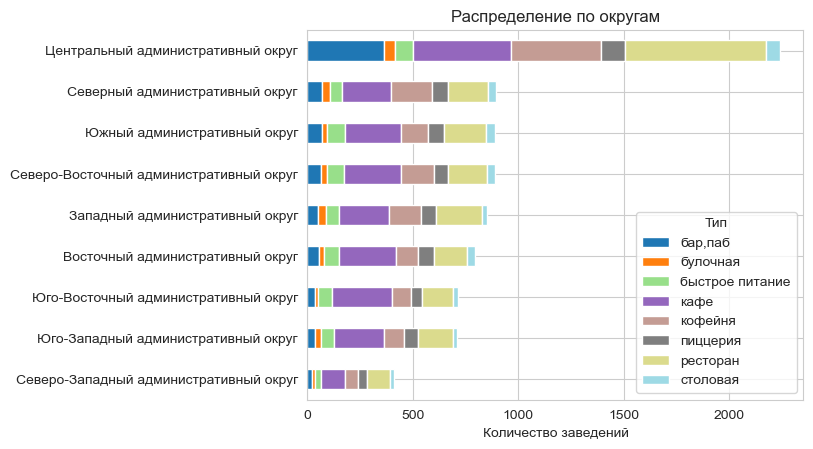

In [69]:
# Создаем график по заведеням по округам с разделением по типам
fig, ax = plt.subplots()

# Создаем график (стековый)
df_district.drop(index='All', columns='All').plot(kind='barh', 
                            stacked=True, colormap='tab20', ax=ax)

ax.set_title("Распределение по округам")
ax.set_ylabel("")
ax.set_xlabel("Количество заведений")
plt.legend(title='Тип')

# Включаем сетку
plt.grid(True)

plt.show()

В Центральном административном округе количество заведений более чем вдвое превышает их количество в любом другом округе. <br>
Посмотрим процентное распределение типов заведений в разрезе районов.

In [70]:
# Выводим процентные соотношения
df_district_percent = df_district.div(df_district['All'], axis=0)*100
# для удобного отображения центрируем и выдаем с точностью до 1 знака (отсекаем 'хвост')
df_district_percent.style.set_properties(**{'text-align': 'center'}).format('{:.1f}')

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
district,,,,,,,,,
Северо-Западный административный округ,5.6,2.9,7.3,28.1,15.2,9.8,26.7,4.4,100.0
Юго-Западный административный округ,5.4,3.8,8.6,33.6,13.5,9.0,23.7,2.4,100.0
Юго-Восточный административный округ,5.3,1.8,9.4,39.5,12.5,7.7,20.3,3.5,100.0
Восточный административный округ,6.6,3.1,8.9,34.1,13.2,9.0,19.9,5.0,100.0
Западный административный округ,5.9,4.4,7.3,28.0,17.6,8.4,25.6,2.8,100.0
Северо-Восточный административный округ,7.1,3.1,9.2,30.2,17.9,7.6,20.3,4.5,100.0
Южный административный округ,7.6,2.8,9.5,29.6,14.7,8.2,22.6,4.9,100.0
Северный административный округ,7.5,4.4,6.5,26.0,21.5,8.6,21.0,4.6,100.0
Центральный административный округ,16.2,2.2,3.9,20.7,19.1,5.0,29.9,2.9,100.0


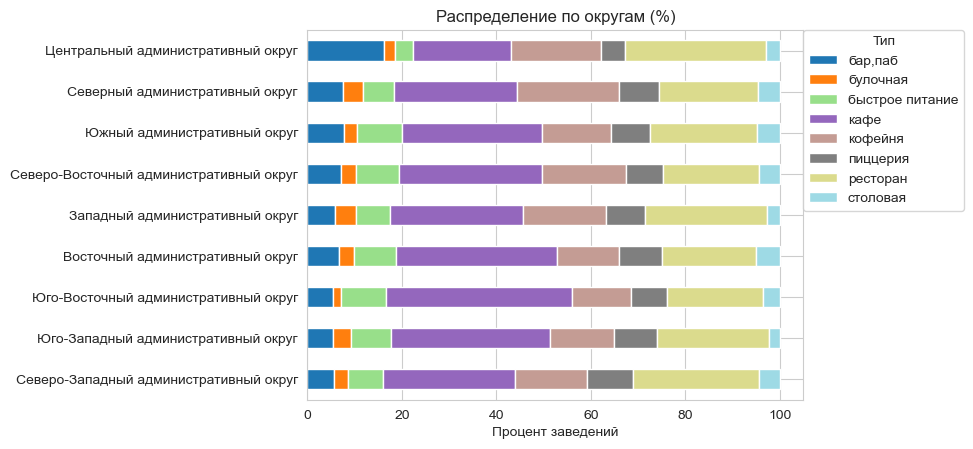

In [71]:
# Создаем график по заведеням по округам с разделением по типам (в %)
fig, ax = plt.subplots()

# Создаем график (стековый)
df_district_percent.drop(index='All', columns='All').plot(kind='barh', 
                            stacked=True, colormap='tab20', ax=ax)

ax.set_title("Распределение по округам (%)")
ax.set_ylabel("")
ax.set_xlabel("Процент заведений")

# Размещаем легенду за пределами графика
plt.legend(title='Тип', bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0.)

# Включаем сетку
plt.grid(True)

plt.show()

In [72]:
# Для распределение построим box_plot
# используем библиотеку plotly для интерактивного взаимодействия.
fig = px.box(df_district_percent.drop(index='All', columns='All'), 
            y=df_district_percent.drop(index='All', columns='All').columns,
            title='Распределение по округам (%)',
            color_discrete_sequence=px.colors.qualitative.Pastel1)

fig.update_layout(xaxis_title='' , yaxis_title='%')

fig.show()

Выбросы по барам и пиццериям связаны с ЦАО. <br>
Гипотеза: большой разброс распределение связан с ЦАО. <br>
Попробуем убрать из распределение ЦАО и проверим как изменились данные

In [73]:
# Уберем из распределения ЦАО
fig = px.box(df_district_percent.drop(index=['All', 'Центральный административный округ'], \
                                      columns='All'), 
            y=df_district_percent.drop(index=['All', 'Центральный административный округ'], \
                                       columns='All').columns,
            title='Распределение по округам (%)',
            color_discrete_sequence=px.colors.qualitative.Pastel1)

fig.update_layout(xaxis_title='' , yaxis_title='%')

fig.show()

Гипотеза частично потвердилась - распределение по категориям в разрезе округов заметно уменьшилось. Выбросов нет, 'усы' короче. Остался разброс по кафе (САО) и кофейням (ЮВАО). 

In [74]:
# Для детального анализа выведем процентные соотношения по категориям в разрезе округов
df_district_percent_cater = df_district.div(df_district.loc['All'])*100
# для удобного отображения центрируем и выдаем с точностью до 1 знака (отсекаем 'хвост')
df_district_percent_cater.style.set_properties(**{'text-align': 'center'}).format('{:.1f}')

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
district,,,,,,,,,
Северо-Западный административный округ,3.0,4.7,5.0,4.8,4.4,6.3,5.3,5.7,4.9
Юго-Западный административный округ,5.0,10.5,10.1,10.0,6.8,10.1,8.2,5.4,8.4
Юго-Восточный административный округ,5.0,5.1,11.1,11.9,6.3,8.7,7.1,7.9,8.5
Восточный административный округ,6.9,9.8,11.8,11.5,7.4,11.4,7.8,12.7,9.5
Западный административный округ,6.5,14.5,10.3,10.0,10.6,11.2,10.7,7.6,10.1
Северо-Восточный административный округ,8.2,10.9,13.6,11.3,11.3,10.7,8.9,12.7,10.6
Южный административный округ,8.9,9.8,14.1,11.1,9.3,11.5,9.9,14.0,10.6
Северный административный округ,8.8,15.2,9.6,9.8,13.7,12.2,9.2,13.0,10.7
Центральный административный округ,47.6,19.5,14.4,19.5,30.3,17.9,32.9,21.0,26.7


**Промежуточный вывод по анализу заведений по округам**: <br>
- В ЦАО количество заведений более чем вдвое превышает их количество в любом другом округе.
- В СЗАО количество заведений заметно меньше, чем в остальных.
- В ЦАО высокий процент баров/пабов (47,6% от всех), ресторанов (32,8%) и кофеин (30,3%). 
- Основной разброс по категориям связан с ЦАО.
- Без учета ЦАО выделяется большой процент кафе в САО и большой процент кофеин в ЮВАО.

#### Анализ рейтингов по категориям

In [75]:
# Создадим таблицу со средними рейтингами по категориям
df_rating = data.groupby('category')['rating'].mean().reset_index() \
.sort_values('rating', ascending=False)

df_rating

,category,rating
0,"бар,паб",4.387696
5,пиццерия,4.301264
6,ресторан,4.290535
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.125021
2,быстрое питание,4.050249


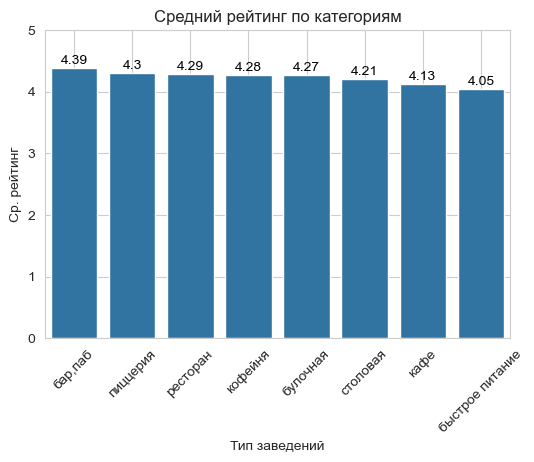

In [76]:
# Выведем распределение среднего рейтинга по категориям заведений
sns.set_style("whitegrid")
sns.color_palette('pastel')
fig, ax = plt.subplots()

# Строим график по средние значения
sns.barplot(data=df_rating, x="category", y="rating", ax=ax)

# Настройки графика
ax.set_title("Средний рейтинг по категориям")
ax.set_ylabel("Ср. рейтинг")
ax.set_xlabel("Тип заведений")
fig.set_figheight(4)
fig.set_figwidth(6)
ax.set_ylim(0,5)

# Поворот подписей оси X для удобства чтения
plt.xticks(rotation=45, fontsize=10)
   
# Добавление меток (с указанием значений над каждым столбцом)
for p in ax.patches:
    count_in_cat = (p.get_height()).round(2)
    ax.annotate(count_in_cat, (p.get_x() + p.get_width()/2, p.get_height()), 
                ha='center', va='baseline', color='black', xytext=(0, 3), 
                textcoords='offset points')

# Включаем сетку
plt.grid(True)

plt.show()

**Промежуточный вывод по анализу рейтингов по категориям**: <br>
- Рейтинги распределены достаточно равномерно.
- Наблюдаются небольшие повышения у баров/пабов.
- Зафиксированы незначительные снижения рейтингов у кафе и заведения быстрого питания.


#### Анализ рейтингов по округам

In [77]:
# читаем файл с данными по районам и сохраняем в переменной
try:
    with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)
except:
    import requests # импорт здесь чтобы не загружать лишние библиотеки при локальной работе
    response = requests.get(r'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson')
    if response.status_code == 200:
        geo_json = response.json()

In [78]:
# запишем координаты Москвы для дальнейшего обращения к ним
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [79]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=data.groupby('district')['rating'].mean(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

In [80]:
data.groupby('district')['rating'].mean()

district
Восточный административный округ           4.174279
Западный административный округ            4.181647
Северный административный округ            4.243080
Северо-Восточный административный округ    4.147978
Северо-Западный административный округ     4.208802
Центральный административный округ         4.377555
Юго-Восточный административный округ       4.101120
Юго-Западный административный округ        4.172920
Южный административный округ               4.184512
Name: rating, dtype: float64

In [81]:
# Отобразим заведения на интерактивной карте Москвы
# создаём карту Москвы (новую, чтобы не было 'наложения')
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

**Промежуточный вывод по анализу рейтингов по округам**: <br>
- Наблюдается повышения рейтинга заведений в ЦАО. В меньшей степени в САО и СЗАО
- Наблюдается понижения рейтинга в ЮВАО


#### Анализ заведений по улицам

In [82]:
# Выведем топ 15 улиц по количеству заведений
df_streets15 = data.groupby('street')['street'].value_counts().reset_index() \
                .sort_values('count', ascending=False).head(15)
df_streets15

,street,count
1092,проспект Мира,183
777,Профсоюзная улица,122
1089,проспект Вернадского,108
529,Ленинский проспект,107
527,Ленинградский проспект,95
377,Дмитровское шоссе,87
300,Варшавское шоссе,76
459,Каширское шоссе,76
528,Ленинградское шоссе,70
554,МКАД,65


In [83]:
# Создаем таблицу с разбивкой по категориям для топ15 улиц
df_streets15_categ = data[data['street'].isin(df_streets15['street'].to_list())].pivot_table(
       index='street', columns='category', values='name', aggfunc='count',
                margins=True).sort_values('All', ascending=True)

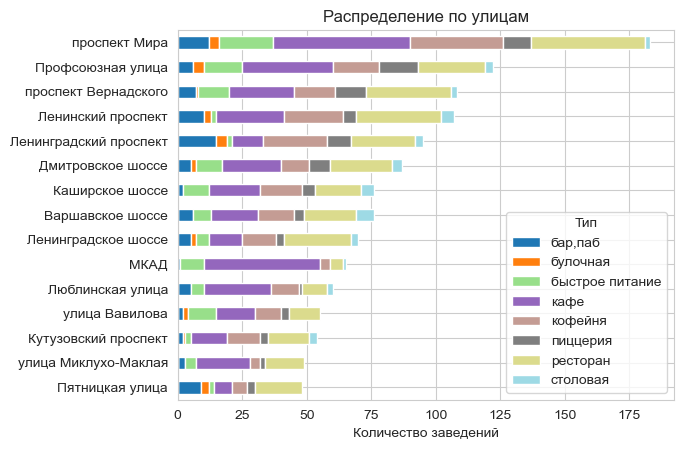

In [84]:
# Создаем график по кол-ву заведений по улицам топ15 с разделением по категориям
fig, ax = plt.subplots()

# Создаем график (стековый)
df_streets15_categ.drop(index='All', columns='All').plot(kind='barh', stacked=True, colormap='tab20', ax=ax)

ax.set_title("Распределение по улицам")
ax.set_ylabel("")
ax.set_xlabel("Количество заведений")
plt.legend(title='Тип')

# Включаем сетку
plt.grid(True)

plt.show()

In [85]:
# Выведем улицы с 1 заведением 
df_streets1 = data.groupby('street')['street'].value_counts().reset_index() \
            
df_streets1[df_streets1['count']==1]

,street,count
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1441,улица Чистова,1
1444,улица Шкулёва,1
1445,улица Шкулёва 4,1
1447,улица Шухова,1


**Промежуточный вывод по анализу заведений по улицам**: <br>
- Анализ по улицам не является информативным, так как зависит от их размеров, данных о которых нет. Количество заведений может указывать как на большую, так и на малую улицу. 
- Оптимальным вариантом для анализа является использование плотности на единицу площади. 

#### Анализ по среднему чеку

In [86]:
# Выведем медианны средних чеков по округам
df_middle_avg_bill = data.groupby('district')['middle_avg_bill'].median() \
                    .reset_index().sort_values('middle_avg_bill')
df_middle_avg_bill

,district,middle_avg_bill
6,Юго-Восточный административный округ,450.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
0,Восточный административный округ,550.0
7,Юго-Западный административный округ,600.0
2,Северный административный округ,650.0
4,Северо-Западный административный округ,700.0
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0


In [87]:
# Выведем на карту распределение среднего чека по округам
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=df_middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m)

# выводим карту
m

**Промежуточный вывод по анализу среднего чека**: <br>
- Самый большой средний чек в ЦАО и ЗАО (1000 руб).
- Самый низкий средний чек в ЮВАО (450 руб).
- Определить влияние удаленности от центра по хроноплету по округам нельзя. Для этого можно использовать данные по районам или по радиусу удаления.

#### Вывод по разделу

Анализ категорий заведений

    В Москве самые популярные типы заведений общественного питания — кафе (28%), рестораны (24%) и кофейни (17%). Остальные категории представлены в меньшем количестве.
    Рейтинги по категориям распределены довольно равномерно. Бары и пабы показывают небольшие повышения рейтинга, тогда как у кафе и заведений быстрого питания фиксируются незначительные снижения.

Анализ посадочных мест

    Количество посадочных мест значительно варьируется в зависимости от типа заведения.
    Максимальное среднее количество посадочных мест наблюдается в ресторанах и барах/пабах.
    По медианным значениям лидируют рестораны и кофейни.
    Большая вариативность в количестве посадочных мест наблюдается в заведениях быстрого питания. Также имеется множество выбросов в категориях ресторанов.

Анализ сетевых заведений

    Несетевые заведения преобладают (61,9%) над сетевыми (38,1%).
    Более половины категорий "кофейня" (51%), "пиццерия" (52%) и "булочная" (61%) являются сетевыми.
    Среди 15 крупнейших сетей доминируют кофейни, рестораны и пиццерии.
    Ведущей сетью в Москве является сеть кофеен "Шоколадница".
    Крупные сети развиваются через франчайзинг, активно инвестируют в маркетинг и повышение узнаваемости бренда.

Анализ заведений по округам

    В Центральном административном округе (ЦАО) количество заведений вдвое превышает их количество в любом другом округе.
    Северо-Западный административный округ (СЗАО) имеет заметно меньшее количество заведений по сравнению с другими округами.
    В ЦАО высокое распределение баров/пабов (47,6%), ресторанов (32,8%) и кофеен (30,3%).
    Основные различия по категориям сконцентрированы в ЦАО.
    За исключением ЦАО, отмечается значительная доля кафе в Северном административном округе (САО) и кофеен в Юго-Восточном административном округе (ЮВАО).
    Рейтинг заведений повышается в ЦАО, в меньшей степени в САО и СЗАО, и снижается в ЮВАО.

Анализу среднего чека

    Самый высокий средний чек зарегистрирован в ЦАО и Западном административном округе (ЗАО), составляющий 1000 рублей.
    Наименьший средний чек в ЮВАО — 450 рублей, при этом наблюдаются самые низкие рейтинги.

Проблемы анализа

    Возникает сложность в чёткости разделения типов заведений, так как отсутствуют явные признаки и юридически значимые категории (например, между кафе и рестораном).
    Трудности в определении количества посадочных мест, особенно для заведений с фудкортом (общие залы для нескольких заведений).
    Уличный анализ слабо информативен из-за отсутствия данных о размерах улиц; количество заведений может отражаться наличием как большой, так и малой улицы. Лучшим вариантом является использование плотности на единицу площади.
    Влияние удаленности от центра по хроноплету по округам трудно определить; для более точного анализа стоит использовать данные по районам или радиус удаления.

Дополнительные данные для увеличения качества анализа

    Разделение по районам
    Плотность населения
    'Точки интереса' - крупные учебные заведения, общежития, бизнес центры, торговые центры, туристические объекты и т.д.

### Детализированный анализ по открытию кофейни 

Проанализируем данные согласно Техническому Заданию. <br>
Количество кофеен в датасете - 1413 шт ([проверке категориальных значений](#Проверка-категориальных-значений) и [анализ категорий заведений](#Анализ-категорий-заведений)) <br>
Разделим кофейни по округам:

In [88]:
df_cafe_dist = data[data['category']=='кофейня'].groupby('district', as_index=False)['category'] \
                    .count().sort_values('category', ascending=False)
df_cafe_dist['percent'] = (df_cafe_dist['category'] / 
                           data[data['category']=='кофейня'].shape[0]*100).round(1)

df_cafe_dist

,district,category,percent
5,Центральный административный округ,428,30.3
2,Северный административный округ,193,13.7
3,Северо-Восточный административный округ,159,11.3
1,Западный административный округ,150,10.6
8,Южный административный округ,131,9.3
0,Восточный административный округ,105,7.4
7,Юго-Западный административный округ,96,6.8
6,Юго-Восточный административный округ,89,6.3
4,Северо-Западный административный округ,62,4.4


In [89]:
# Отобразим заведения на интерактивной карте Москвы
# создаём карту Москвы (новую, чтобы не было 'наложения')
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data[data['category']=='кофейня'].apply(create_clusters, axis=1)

# выводим карту
m

Большинство кофеен выбирают для размещения локации, которые обеспечивают высокий уровень проходимости: первые линии улиц с активным пешеходным и автомобильным трафиком, а также торговые центры. <br>
30% всех кофеен находятся в ЦАО и только 4.4% в СЗАО <br>
Далее изучим наличие круглосуточных кофеен и их процент от общего числа.

In [90]:
data[(data['category']=='кофейня') & data.is_24_7].shape[0]

59

Круглосуточных кофеен 59 штук. Разделим их по районам

In [91]:
df_cafe_24_7 = data[(data['category']=='кофейня') & data.is_24_7] \
                    .groupby('district', as_index=False)['category'] \
                        .count().sort_values('category', ascending=False)

df_cafe_24_7['percent'] = (df_cafe_24_7['category'] / 
                           data[data['category']=='кофейня'].shape[0]*100).round(2)

df_cafe_24_7

,district,category,percent
5,Центральный административный округ,26,1.84
1,Западный административный округ,9,0.64
7,Юго-Западный административный округ,7,0.50
0,Восточный административный округ,5,0.35
2,Северный административный округ,5,0.35
3,Северо-Восточный административный округ,3,0.21
4,Северо-Западный административный округ,2,0.14
6,Юго-Восточный административный округ,1,0.07
8,Южный административный округ,1,0.07


Основное количество круглосуточных кофеен в ЦАО. В ЮВАО и ЮАО всего по 1 круглосуточной кофеине. <br>
Посмотрим на рейтинги кофеен. Средний рейтинг был рассмотрен [ранее](#Анализ-рейтингов-по-категориям) и составляет 4.28

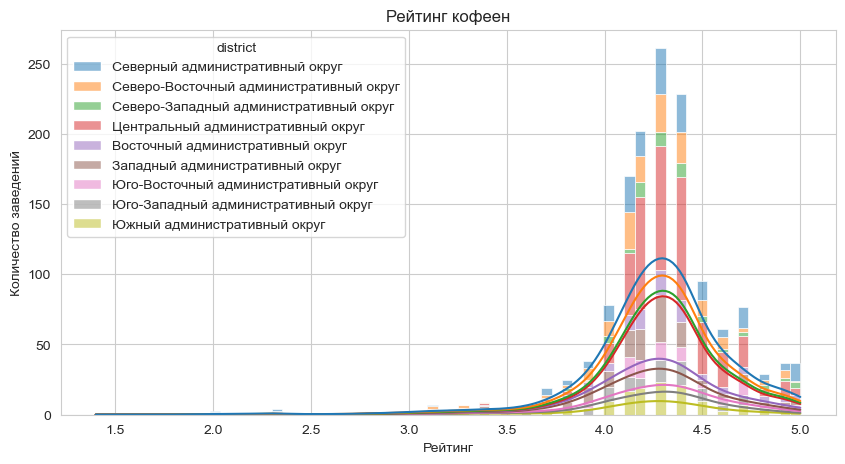

In [92]:
# Выведем распределение по рейтингу с указанием округа
sns.set_style("whitegrid")
fig, ax = plt.subplots()

# Строим график
sns.histplot(data=data[data['category']=='кофейня'], x="rating",
            kde=True, hue='district', bins='auto', multiple='stack',
             ax=ax, legend=True)

# Настройки графика
ax.set_title("Рейтинг кофеен")
ax.set_ylabel("Количество заведений")
ax.set_xlabel("Рейтинг")
fig.set_figheight(5)
fig.set_figwidth(10)

# Включаем сетку
plt.grid(True)

plt.show()

In [93]:
# Выведем средний рейтинг по округам
data[data['category']=='кофейня'].groupby('district')['rating'].mean()

district
Восточный административный округ           4.282857
Западный административный округ            4.195333
Северный административный округ            4.291710
Северо-Восточный административный округ    4.216981
Северо-Западный административный округ     4.325806
Центральный административный округ         4.336449
Юго-Восточный административный округ       4.225843
Юго-Западный административный округ        4.283333
Южный административный округ               4.232824
Name: rating, dtype: float64

Рейтинг кофеин распределяется равномерно по округам

In [94]:
# Проверим что средняя цена чашки капучинно указано только для кофеин
data[(data['category']=='кофейня') & 
     (data['middle_coffee_cup'])]['category'].unique()

array(['кофейня'], dtype=object)

Потвердилось что средняя цена чашки капучино указано только для кофеен. <br>
Посмотрим общие показатели по столбцу 'middle_coffee_cup':

In [95]:
data[data['category']=='кофейня']['middle_coffee_cup'].describe()

count    521.000000
mean     172.537428
std       65.806645
min       60.000000
25%      124.000000
50%      170.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

Цена чашки капучино указана не для всех кофеен(1413), а только для 521 заведения. <br>
Средняя стоимость 172,5 руб близка к медианной 170 руб.  <br>
Для визуализации построим гистограмму

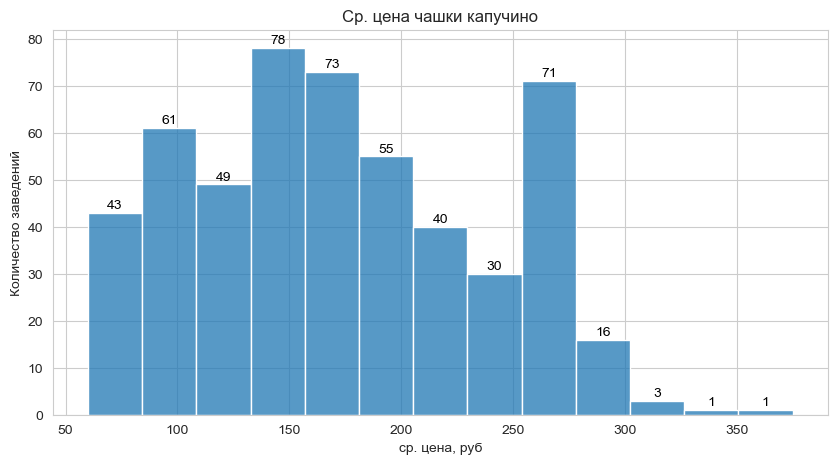

In [96]:
# Выведем распределение по средней цене чашки капучино
sns.set_style("whitegrid")
fig, ax = plt.subplots()

# Строим график
sns.histplot(data=data[data['category']=='кофейня'], x="middle_coffee_cup",
            bins='auto', ax=ax)

# Настройки графика
ax.set_title("Ср. цена чашки капучино")
ax.set_ylabel("Количество заведений")
ax.set_xlabel("ср. цена, руб")
fig.set_figheight(5)
fig.set_figwidth(10)

# Добавление меток (с указанием значений над каждым столбцом)
for p in ax.patches:
    count_in_cat = (p.get_height()).round(2)
    ax.annotate(count_in_cat, (p.get_x() + p.get_width()/2, p.get_height()), 
                ha='center', va='baseline', color='black', xytext=(0, 3), 
                textcoords='offset points')

# Включаем сетку
plt.grid(True)

plt.show()

In [97]:
# Выведем медианну ср. цену чашки капучино по округам с округлением до 10 руб
data[data['category']=='кофейня'].groupby('district', as_index=False
                        )['middle_coffee_cup'].median() \
                    .sort_values('middle_coffee_cup', ascending=False).round(-1)

,district,middle_coffee_cup
7,Юго-Западный административный округ,200.0
5,Центральный административный округ,190.0
1,Западный административный округ,190.0
4,Северо-Западный административный округ,160.0
3,Северо-Восточный административный округ,160.0
2,Северный административный округ,160.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,150.0
0,Восточный административный округ,140.0


По имеющимся данным рекомендуется использовать медианну цены кофе по округу, с округлением до 10 рублей. <br>
Для более точной рекомендации по ценовой политике требуется провести поведенческий анализ целевой аудитории, определиться с бизнес моделью и провести анализ по районам.

Значение конкурентности зачастую преувеличивают. В бизнесе намного важнее продукт, который вы можете предложить клиенту, ваши ресурсы и компетенцию вашей команды. <br>
На высококонкурентные рынки сложнее заходить - требуется больше ресурсов, времени и хорошо продуманная маркетинговая компания. <br><br>
**Любой бизнес это индивидуальный проект.** <br><br>
Для открытия собственной кофейни важно четко определить подход к бизнесу, ответив на ряд вопросов: <br>
* **Бизнес модель** - стремитесь ли вы к максимизации прибыли или ваш проект больше для души? Первый подход предполагает, что основное внимание уделяется финансовым результатам и экономической эффективности. Второй подход предполагает, что вы ориентируетесь на собственное удовлетворение и интерес к делу, не забывая при этом о финансовых аспектах, но не делая их главным приоритетом.
* **Перспективы развития** - необходимо определить, планируется ли дальнейшее расширение сети кофеен. В случае положительного ответа следует выяснить, какие типы масштабирования являются приоритетными.
* **Концепция заведения:** необходимо определить, будет ли концепция интерьера, дизайна и меню выдержана в стиле Central Perk из сериала «Друзья» или же будет выбрана другая концепция. Это оказывает значительное влияние на целевую аудиторию, что, в свою очередь, влияет на выбор приоритетных мест расположения кофеен.
* **Определение целевой аудитории** и анализ её предпочтений — необходимо выявить, какой тип клиента является предпочтительным.
* Для модели 'для души' - приоритетное расположение заведения относительно вашего места пребывания. Важно учитывать баланс между удобством расположения заведения относительно вашего места пребывания и его размещением для целевого клиента.

**Рекомендации по открытию кофейни:** <br>

1. Определить бизнес-модель и провести анализ целевой аудитории (ЦА).
2. Выполнить анализ конкурентов.
3. Дополнить анализ данными по районам (в текущую задачу, согласно ТЗ, это не входит).
4. При наличии данных, провести анализ времени существования кофеен в разрезе районов. Это позволит выявить общие рыночные тенденции и оценить успех или провал заведений. Анализ неудачных кейсов зачастую дает более ценные данные, чем успешных.
5. **Формирование рекомендаций на основе текущих данных преждевременно.** Не исследованы и не определены многие ключевые метрики.



**Дополнительная информация:** <br>
* Несмотря на то, что сериал «Друзья» выходил в 1994-2004 году у него есть аудитория до сих пор. По [анализу от Яндекса](https://yandex.ru/company/researches/2019/friends): выше всего интерес к сериалу — среди тех, кому сейчас от 18 до 24 лет (данные за 2019 год). По данным рейтинга [Кинопоиск](https://www.kinopoisk.ru/film/77044/votes/) сериал занимает 5 место по рейтингу и новые оценки появляются регулярно (данные на 2024 год)

Данные с Кинопоиск по средней оценки по категориям: <br>
|Категория|Средняя оценка|
|:-|-:|
|18-24|126.53299999999997|
|25-34|127.73200000000004|
|35-44|128.52900000000002|
|45+|122.064|
|до 18 лет|126.14500000000002|
|женщины|130.726|
|мужчины|125.54899999999999|
|не Россия|126.681|
|Россия|129.084|

### Общий вывод

**Предобработка данных:** <br><br>
- Было удалено 3 объекта с огромным средним чеком и подозрительным расположением;
- Изменены типы данных для удобства работы;
- Обработанны пропуски. По итогу пропуски остались в столбцах 'middle_avg_bill', 'middle_coffee_cup' и 'seats'. Пропуски были заполнены значением 'н.д.' (нет данных) где нет возможности подобрать замену. По столбцу 'seats' частично пропуски были заменены медианным значением по сети и категории заведения (только для сетевых заведений);
- Явных дубликатов не обнаружено;
- Замена разных названий сетевых заведений ('Яндекс.Лавка' и 'Яндекс Лавка');
- Добавленые необходимые для анализа столбцы 'street' (с указанием улицы) и 'is_24_7' (с указанием круглосуточных заведений);
- В столбце 'district' указаны не районы, а административные округа г. Москвы

**Анализ категорий заведений**

  * В Москве самые популярные типы заведений общественного питания — кафе (28%), рестораны (24%) и кофейни (17%). Остальные категории представлены в меньшем количестве.
  * Рейтинги по категориям распределены довольно равномерно. Бары и пабы показывают небольшие повышения рейтинга, тогда как у кафе и заведений быстрого питания фиксируются незначительные снижения.

**Анализ посадочных мест**

  * Количество посадочных мест значительно варьируется в зависимости от типа заведения.
  * Максимальное среднее количество посадочных мест наблюдается в ресторанах и барах/пабах.
  * По медианным значениям лидируют рестораны и кофейни.
  * Большая вариативность в количестве посадочных мест наблюдается в заведениях быстрого питания.
  * Также имеется множество выбросов в категориях ресторанов.

**Анализ сетевых заведений**

  * Несетевые заведения преобладают (61,9%) над сетевыми (38,1%).
  * Более половины категорий "кофейня" (51%), "пиццерия" (52%) и "булочная" (61%) являются сетевыми.
  * Среди 15 крупнейших сетей доминируют кофейни, рестораны и пиццерии.
  * Ведущей сетью в Москве является сеть кофеен "Шоколадница". В датасете нет данных по некоторым крупным известным сетям быстрого питания, например "Макдональдс"/"Вкусно и точка", "Бургер кинг", "Ростикс"/"KFC" и другим.
  * Крупные сети развиваются через франчайзинг, активно инвестируют в маркетинг и повышение узнаваемости бренда.

**Анализ заведений по округам**

  * В Центральном административном округе (ЦАО) количество заведений вдвое превышает их количество в любом другом округе.
  * Северо-Западный административный округ (СЗАО) имеет заметно меньшее количество заведений по сравнению с другими округами.
  * В ЦАО высокое распределение баров/пабов (47,6%), ресторанов (32,8%) и кофеен (30,3%).
  * Основные различия по категориям сконцентрированы в ЦАО.
  * За исключением ЦАО, отмечается значительная доля кафе в Северном административном округе (САО) и кофеен в Юго-Восточном административном округе (ЮВАО).
  * Рейтинг заведений повышается в ЦАО, в меньшей степени в САО и СЗАО, и снижается в ЮВАО.

**Анализу среднего чека**

  * Самый высокий средний чек зарегистрирован в ЦАО и Западном административном округе (ЗАО), составляющий 1000 рублей.
  * Наименьший средний чек в ЮВАО — 450 рублей, при этом наблюдаются самые низкие рейтинги.

**Проблемы анализа**

  * Возникает сложность в чёткости разделения типов заведений, так как отсутствуют явные признаки и юридически значимые категории (например, между кафе и рестораном).
  * Трудности в определении количества посадочных мест, особенно для заведений с фудкортом (общие залы для нескольких заведений).
  * Уличный анализ слабо информативен из-за отсутствия данных о размерах улиц; количество заведений может отражаться наличием как большой, так и малой улицы. Лучшим вариантом является использование плотности на единицу площади.
  * Влияние удаленности от центра по хроноплету по округам трудно определить; для более точного анализа стоит использовать данные по районам или радиус удаления.

**Дополнительные данные для увеличения качества анализа**

  * Разделение по районам
  * Плотность населения
  * 'Точки интереса' - крупные учебные заведения, общежития, бизнес центры, торговые центры, туристические объекты и т.д.

**Рекомендации по открытию кофейни:** <br>

1. Определить бизнес-модель и провести анализ целевой аудитории (ЦА).
2. Выполнить анализ конкурентов.
3. Дополнить анализ данными по районам (в текущую задачу, согласно ТЗ, это не входит).
4. При наличии данных, провести анализ времени существования кофеен в разрезе районов. Это позволит выявить общие рыночные тенденции и оценить успех или провал заведений. Анализ неудачных кейсов зачастую дает более ценные данные, чем успешных.
5. **Формирование рекомендаций по открытию кофеини на основе текущих данных преждевременно.** Не исследованы и не определены многие ключевые метрики.

